## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import HistGradientBoostingRegressor
import lime
import shap

c:\Users\ABHIROOP\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings("ignore")

## Data upload and Preprocessing

In [3]:
data = pd.read_csv("..\data\Kolkata-1973-2024-cleaned.csv", parse_dates=['DATE'], index_col='DATE')
data.head(10)

,DEWP,MAX,MIN,MXSPD,PRCP,TEMP,VISIB,WDSP,Fog,Rain,Snow,Hail,Thunder,Tornado
DATE,,,,,,,,,,,,,,
1973-01-01,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-02,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-03,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-04,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,0.0,0.0,0.0
1973-01-05,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-06,53.9,29.0,12.0,6.3,0.0,20.833333,2.4,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-07,56.5,30.0,13.0,4.6,0.0,21.555556,1.1,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-08,65.6,31.0,18.0,2.9,0.0,24.444444,1.5,0.5,1.0,0.0,0.0,0.0,0.0,0.0
1973-01-09,65.9,33.0,19.0,7.0,0.0,25.333333,1.5,2.9,1.0,0.0,0.0,0.0,0.0,0.0


In [4]:
data.drop(columns=['Snow', 'Hail', 'Tornado'], inplace=True)
data.head()

,DEWP,MAX,MIN,MXSPD,PRCP,TEMP,VISIB,WDSP,Fog,Rain,Thunder
DATE,,,,,,,,,,,
1973-01-01,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0
1973-01-02,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0
1973-01-03,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0
1973-01-04,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0
1973-01-05,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0


In [5]:
cols = list(data.columns)
cols1 = [_ + '-1' for _ in cols]
col1 = dict(map(lambda i,j : (i,j) , cols,cols1))
cols2 = [_ + '-2' for _ in cols]
col2 = dict(map(lambda i,j : (i,j) , cols,cols2))
cols3 = [_ + '-3' for _ in cols]
col3 = dict(map(lambda i,j : (i,j) , cols,cols3))
cols4 = [_ + '-4' for _ in cols]
col4 = dict(map(lambda i,j : (i,j) , cols,cols4))
cols5 = [_ + '-5' for _ in cols]
col5 = dict(map(lambda i,j : (i,j) , cols,cols5))
cols6 = [_ + '-6' for _ in cols]
col6 = dict(map(lambda i,j : (i,j) , cols,cols6))
cols7 = [_ + '-7' for _ in cols]
col7 = dict(map(lambda i,j : (i,j) , cols,cols7))
cols8 = [_ + '-8' for _ in cols]
col8 = dict(map(lambda i,j : (i,j) , cols,cols8))   
cols9 = [_ + '-9' for _ in cols]
col9 = dict(map(lambda i,j : (i,j) , cols,cols9))
cols10 = [_ + '-10' for _ in cols]
col10 = dict(map(lambda i,j : (i,j) , cols,cols10))

In [6]:
s1 = data[:].shift(+1).rename(columns=col1)
s2 = data[:].shift(+2).rename(columns=col2)
s3 = data[:].shift(+3).rename(columns=col3)
s4 = data[:].shift(+4).rename(columns=col4)
s5 = data[:].shift(+5).rename(columns=col5)
s6 = data[:].shift(+6).rename(columns=col6)
s7 = data[:].shift(+7).rename(columns=col7)
s8 = data[:].shift(+8).rename(columns=col8) 
s9 = data[:].shift(+9).rename(columns=col9)
s10 = data[:].shift(+10).rename(columns=col10)
data_input = pd.concat([s1, s2, s3, s4, s5, s6, s7, s8, s9, s10], axis=1)
data_input.head(10)

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,MAX-10,MIN-10,MXSPD-10,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-02,66.0,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-03,56.2,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-04,54.9,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-05,51.1,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-06,54.5,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-07,53.9,29.0,12.0,6.3,0.0,20.833333,2.4,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-08,56.5,30.0,13.0,4.6,0.0,21.555556,1.1,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-09,65.6,31.0,18.0,2.9,0.0,24.444444,1.5,0.5,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
null_locations = data_input.isnull()

# Display rows and columns with NaN values
null_positions = null_locations.stack()[null_locations.stack()]
print(null_positions)

DATE                  
1973-01-01  DEWP-1        True
            MAX-1         True
            MIN-1         True
            MXSPD-1       True
            PRCP-1        True
                          ... 
1973-01-10  VISIB-10      True
            WDSP-10       True
            Fog-10        True
            Rain-10       True
            Thunder-10    True
Length: 605, dtype: bool


In [8]:
data_input.dropna(inplace=True)
data_input.head()

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,MAX-10,MIN-10,MXSPD-10,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.0,18.0,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,28.0,19.0,2.9,0.0,23.611111,1.7,0.6,0.0,0.0,0.0
1973-01-12,60.1,29.0,16.0,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,26.0,15.0,7.0,0.0,20.777778,2.1,1.9,0.0,0.0,0.0
1973-01-13,64.6,29.0,17.0,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,26.0,14.0,4.9,0.0,20.000000,2.7,1.5,0.0,0.0,0.0
1973-01-14,65.9,29.0,17.0,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,28.0,12.0,4.9,0.0,20.111111,2.8,0.9,0.0,0.0,0.0
1973-01-15,50.0,27.0,13.0,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,27.0,11.0,8.0,0.0,21.333333,2.1,1.8,1.0,0.0,0.0


In [9]:
data_input['Day of Year'] = data_input.index.day_of_year
data_input['Year'] = data_input.index.year
data_input['Month'] = data_input.index.month
data_input

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10,Day of Year,Year,Month
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.000000,18.000000,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,11,1973,1
1973-01-12,60.1,29.000000,16.000000,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,12,1973,1
1973-01-13,64.6,29.000000,17.000000,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,13,1973,1
1973-01-14,65.9,29.000000,17.000000,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,14,1973,1
1973-01-15,50.0,27.000000,13.000000,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,15,1973,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-08,72.8,31.611111,23.888889,6.0,0.0,27.666667,1.8,3.7,0.0,0.0,...,0.0,29.722222,2.0,2.3,0.0,0.0,0.0,313,2024,11
2024-11-09,71.5,32.000000,22.777778,7.0,0.0,27.222222,2.1,4.7,0.0,0.0,...,0.0,29.500000,2.0,4.0,0.0,0.0,0.0,314,2024,11
2024-11-10,70.7,31.611111,23.000000,7.0,0.0,27.055556,2.3,3.8,0.0,0.0,...,0.0,30.000000,2.1,4.0,0.0,0.0,0.0,315,2024,11


In [10]:
data_input.drop(data_input.tail(1).index,inplace=True)
data_input

,DEWP-1,MAX-1,MIN-1,MXSPD-1,PRCP-1,TEMP-1,VISIB-1,WDSP-1,Fog-1,Rain-1,...,PRCP-10,TEMP-10,VISIB-10,WDSP-10,Fog-10,Rain-10,Thunder-10,Day of Year,Year,Month
DATE,,,,,,,,,,,,,,,,,,,,,
1973-01-11,62.2,29.000000,18.000000,7.0,0.0,24.000000,3.0,4.2,0.0,0.0,...,0.0,23.611111,1.7,0.6,0.0,0.0,0.0,11,1973,1
1973-01-12,60.1,29.000000,16.000000,3.9,0.0,22.888889,2.5,1.3,0.0,0.0,...,0.0,20.777778,2.1,1.9,0.0,0.0,0.0,12,1973,1
1973-01-13,64.6,29.000000,17.000000,5.8,0.0,23.166667,2.7,3.0,0.0,0.0,...,0.0,20.000000,2.7,1.5,0.0,0.0,0.0,13,1973,1
1973-01-14,65.9,29.000000,17.000000,8.0,0.0,23.666667,2.6,2.8,0.0,0.0,...,0.0,20.111111,2.8,0.9,0.0,0.0,0.0,14,1973,1
1973-01-15,50.0,27.000000,13.000000,8.9,0.0,18.722222,2.5,2.0,0.0,0.0,...,0.0,21.333333,2.1,1.8,1.0,0.0,0.0,15,1973,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-07,71.9,32.611111,24.388889,8.0,0.0,27.777778,2.0,2.8,0.0,0.0,...,0.0,29.777778,2.0,2.4,0.0,0.0,0.0,312,2024,11
2024-11-08,72.8,31.611111,23.888889,6.0,0.0,27.666667,1.8,3.7,0.0,0.0,...,0.0,29.722222,2.0,2.3,0.0,0.0,0.0,313,2024,11
2024-11-09,71.5,32.000000,22.777778,7.0,0.0,27.222222,2.1,4.7,0.0,0.0,...,0.0,29.500000,2.0,4.0,0.0,0.0,0.0,314,2024,11


In [11]:
data_output = data[['MAX', 'MIN']].loc['1973-01-11':]
data_output = data_output.shift(-1)
data_output.dropna(inplace=True)
data_output

,MAX,MIN
DATE,,
1973-01-11,29.000000,17.000000
1973-01-12,29.000000,17.000000
1973-01-13,27.000000,13.000000
1973-01-14,26.000000,14.000000
1973-01-15,25.000000,11.000000
...,...,...
2024-11-07,32.000000,22.777778
2024-11-08,31.611111,23.000000
2024-11-09,31.777778,21.388889


## Train-Test Split

In [12]:
train_start = data_input.index[0].date()
train_end = '2014-12-31'
print(f"Training done from {train_start} to {train_end}")

test_start = '2015-01-01'
test_end = data_input.index[-1].date()
print(f"Testing done from {test_start} to {test_end}")

Training done from 1973-01-11 to 2014-12-31
Testing done from 2015-01-01 to 2024-11-11


In [13]:
# Training set
X_train = data_input.loc[train_start:train_end]
y_train = data_output.loc[train_start:train_end]
print("Training Size: ",len(X_train))

# Testing set
X_test = data_input.loc[test_start:test_end]
y_test = data_output.loc[test_start:test_end]
print("Testing Size: ",len(X_test))

Training Size:  15330
Testing Size:  3603


In [14]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler2 = StandardScaler()
y_train_scaled = scaler2.fit_transform(y_train)
y_test_scaled = scaler2.transform(y_test)

In [15]:
def willmott_index(y_true, y_pred):
    """
    Calculates the Willmott Index (WI).
    """
    numerator = np.sum((y_pred - y_true)**2)
    denominator = np.sum( np.abs(y_true - np.mean(y_true)) + np.abs(y_pred - np.mean(y_pred))) 
    return 1-(numerator / denominator)

def percent_bias(y_true, y_pred):
    """
    Calculates the Percent Bias (PBIAS).
    """
    return 100 * np.sum(y_pred - y_true) / np.sum(y_true)

## Linear Regression

In [26]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
pred_lr=model_lr.predict(X_test)

print("Linear Regression - Root Mean Squared Error:", root_mean_squared_error(pred_lr, y_test))
print("Linear Regression - Mean Absolute Error:", mean_absolute_error(pred_lr, y_test))
print("Linear Regression - Mean Absolute Percentage Error:", mean_absolute_percentage_error(pred_lr, y_test))
print("Linear Regression - R2 Score:", r2_score(pred_lr, y_test))
print("Linear Regression - Willmott Index:", willmott_index(np.array(y_test), pred_lr))
print("Linear Regression - Percent Bias:", percent_bias(np.array(y_test), pred_lr))

Linear Regression - Root Mean Squared Error: 1.9422089418216215
Linear Regression - Mean Absolute Error: 1.485103340868841
Linear Regression - Mean Absolute Percentage Error: 0.05801135559896249
Linear Regression - R2 Score: 0.7609114509492743
Linear Regression - Willmott Index: 0.6354273841265523
Linear Regression - Percent Bias: -0.19469023121832182


In [27]:
for i in range(2):
    print(y_train.columns[i] + "\n")
    coef_pairs = [(X_test.columns[j], model_lr.coef_[i][j].round(5)) for j in range(len(X_test.columns))]
    sorted_coef = sorted(coef_pairs, key=lambda x: x[1], reverse=True)

    for col, coeff in sorted_coef:
        print(col, "=", coeff)
    print()

MAX

TEMP-1 = 0.32059
Fog-1 = 0.27363
MAX-1 = 0.27078
Thunder-7 = 0.19471
Thunder-6 = 0.17295
Thunder-5 = 0.14934
WDSP-2 = 0.11204
Thunder-4 = 0.09325
Rain-10 = 0.09036
Rain-7 = 0.08925
Rain-9 = 0.08263
MAX-2 = 0.07498
TEMP-7 = 0.07116
Fog-7 = 0.07018
TEMP-10 = 0.06389
VISIB-4 = 0.0634
VISIB-5 = 0.06311
Thunder-8 = 0.05678
MAX-3 = 0.05591
MAX-5 = 0.05062
TEMP-6 = 0.04794
Rain-2 = 0.04359
VISIB-6 = 0.04189
MAX-4 = 0.03935
Fog-3 = 0.03456
MAX-10 = 0.03456
Rain-8 = 0.03453
WDSP-6 = 0.03349
Thunder-10 = 0.03166
VISIB-7 = 0.02824
MIN-3 = 0.02787
MAX-8 = 0.02692
MAX-9 = 0.02552
WDSP-3 = 0.01755
MXSPD-1 = 0.01642
MAX-6 = 0.01565
MIN-10 = 0.0143
MIN-4 = 0.01412
Rain-6 = 0.01273
VISIB-9 = 0.01252
MXSPD-9 = 0.01193
WDSP-10 = 0.01105
WDSP-7 = 0.01031
WDSP-4 = 0.01019
MXSPD-10 = 0.01019
WDSP-8 = 0.00998
TEMP-9 = 0.00924
Rain-4 = 0.00794
MIN-9 = 0.00703
MAX-7 = 0.00682
WDSP-5 = 0.00613
MXSPD-4 = 0.00543
MXSPD-8 = 0.00533
DEWP-8 = 0.00456
PRCP-1 = 0.00433
MXSPD-5 = 0.00429
MIN-2 = 0.00414
PRCP-3 = 0

## Decision Tree Regressor

In [28]:
# Decision Tree
param_grid = { 'max_depth': [ 5, 6, 7, 8, 9, 10], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [15, 20, 25, 30, 40, 50, 60, 75, 100]}

model_dt = DecisionTreeRegressor(random_state=0)

grid_search = GridSearchCV(estimator=model_dt, param_grid=param_grid, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_model_dt = grid_search.best_estimator_

pred_dt = best_model_dt.predict(X_test)

rmse = root_mean_squared_error(y_test, pred_dt)
mae = mean_absolute_error(y_test, pred_dt)
mape = mean_absolute_percentage_error(y_test, pred_dt)
r2 = r2_score(y_test, pred_dt)
wi = willmott_index(np.array(y_test), pred_dt)
pbi = percent_bias(np.array(y_test), pred_dt)

print("Decision Tree - Best Parameters:", grid_search.best_params_)
print("Decision Tree - Root Mean Squared Error:", rmse)
print("Decision Tree - Mean Absolute Error:", mae)
print("Decision Tree - Mean Absolute Percentage Error:", mape)
print("Decision Tree - R2 Score:", r2)
print("Decision Tree - Willmott Index:", wi)
print("Decision Tree - Percent Bias:", pbi)

Decision Tree - Best Parameters: {'max_depth': 7, 'min_samples_leaf': 60, 'min_samples_split': 2}
Decision Tree - Root Mean Squared Error: 2.010460123089262
Decision Tree - Mean Absolute Error: 1.5469634259735288
Decision Tree - Mean Absolute Percentage Error: 0.061508825213882345
Decision Tree - R2 Score: 0.8041999497325233
Decision Tree - Willmott Index: 0.6106241566965487
Decision Tree - Percent Bias: -0.8101986588689676


## Gradient Boosting Regressor

In [17]:
model_gbr1 = HistGradientBoostingRegressor(max_iter = 5000)
model_gbr1.fit(X_train, y_train['MAX'])
pred_gbr1 = model_gbr1.predict(X_test)

model_gbr2 = HistGradientBoostingRegressor(max_iter = 5000)
model_gbr2.fit(X_train, y_train['MIN'])
pred_gbr2 =model_gbr2.predict(X_test)

pred_gbr =  np.vstack((pred_gbr1, pred_gbr2)).T

print("Root mean squared error: ",root_mean_squared_error(y_test, pred_gbr))
print("Mean absolute error: ",mean_absolute_error(y_test, pred_gbr))
print("Mean absolute percentage error: ",mean_absolute_percentage_error(y_test, pred_gbr))
print("R2 score: ",r2_score(y_test, pred_gbr))
print("Willmott Index: ",willmott_index(np.array(y_test), pred_gbr))
print("Percent Bias: ",percent_bias(np.array(y_test), pred_gbr))

Root mean squared error:  1.859069740743164
Mean absolute error:  1.4027484358242757
Mean absolute percentage error:  0.055970462923587136
R2 score:  0.8296367762674686
Willmott Index:  0.6609378991706001
Percent Bias:  0.1126551345103642


In [24]:
import pickle
with open('model_gbr_2_1.pkl', 'wb') as f:
    pickle.dump(model_gbr1, f)
with open('model_gbr_2_2.pkl', 'wb') as f:
    pickle.dump(model_gbr2, f)

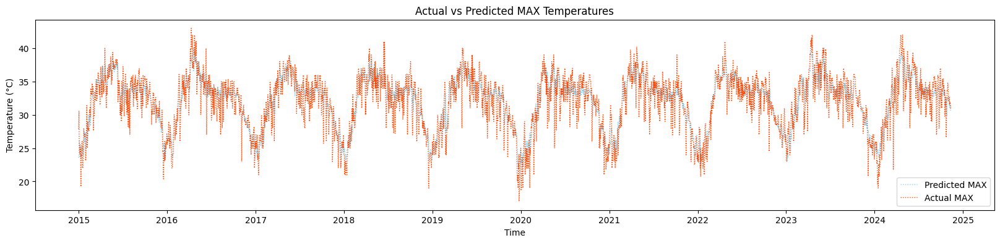

In [23]:
plt.figure(figsize=(20, 4))  
plt.plot(X_test.index, pred_gbr[:, 0], label='Predicted MAX', linewidth=1, linestyle=':', color='skyblue')
plt.plot(X_test.index, y_test['MAX'], label='Actual MAX', linewidth=1, linestyle=':', color='orangered')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.title("Actual vs Predicted MAX Temperatures")
plt.show()

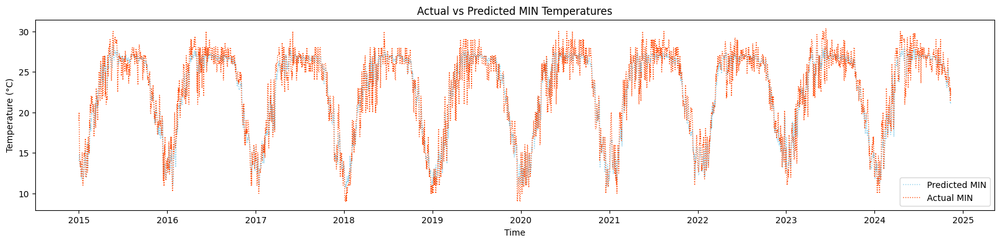

In [25]:
plt.figure(figsize=(20, 4))
plt.plot(X_test.index, pred_gbr[:, 1], label='Predicted MIN', linewidth=1, linestyle=':', color='skyblue')
plt.plot(X_test.index, y_test['MIN'], label='Actual MIN', linewidth=1, linestyle=':', color='orangered')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.title("Actual vs Predicted MIN Temperatures")
plt.show()

In [20]:
pred_gbr_df = pd.DataFrame(pred_gbr, index=y_test.index, columns=['MAX', 'MIN'])
y_test['Month'] = y_test.index.month
pred_gbr_df['Month'] = pred_gbr_df.index.month

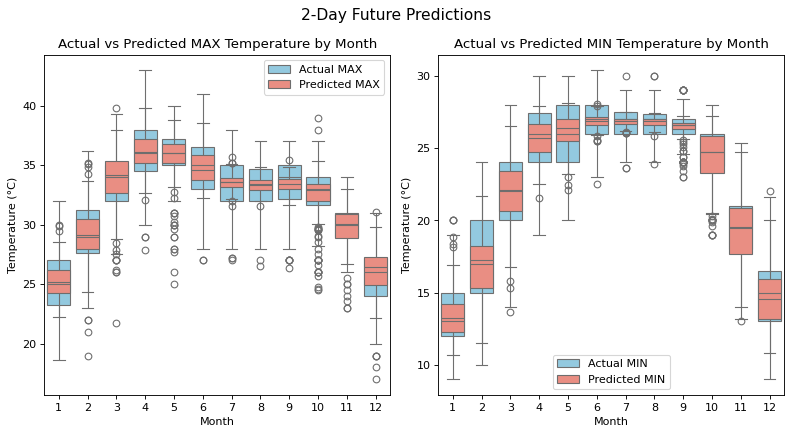

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(1, 2, figsize=(10, 5.5), dpi=80)
sns.boxplot(x=y_test['Month'], y=y_test['MAX'], ax=ax[0], color='skyblue', label='Actual MAX')
sns.boxplot(x=pred_gbr_df['Month'], y=pred_gbr_df['MAX'], ax=ax[0], color='salmon', label='Predicted MAX')
sns.boxplot(x=y_test['Month'], y=y_test['MIN'], ax=ax[1], color='skyblue', label='Actual MIN')
sns.boxplot(x=pred_gbr_df['Month'], y=pred_gbr_df['MIN'], ax=ax[1], color='salmon', label='Predicted MIN')

ax[0].set_title("Actual vs Predicted MAX Temperature by Month")
ax[1].set_title("Actual vs Predicted MIN Temperature by Month")

for i in range(2): ax[i].set_ylabel("Temperature (°C)")
fig.suptitle("2-Day Future Predictions", fontsize=14)
plt.tight_layout()
plt.show()

## Bagging Regressor

In [30]:
model_bg = BaggingRegressor(n_estimators = 200, max_features = 1.0, max_samples = 1.0, random_state = 42)
model_bg.fit(X_train, y_train)

pred_bg = model_bg.predict(X_test)

print("Bagging - Root Mean Squared Error:", root_mean_squared_error(y_test, pred_bg))
print("Bagging - Mean Absolute Error:", mean_absolute_error(y_test, pred_bg))
print("Bagging - Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, pred_bg))
print("Bagging - R2 Score:", r2_score(y_test, pred_bg))
print("Bagging - Willmott Index:", willmott_index(np.array(y_test), pred_bg))
print("Bagging - Percent Bias:", percent_bias(np.array(y_test), pred_bg))

Bagging - Root Mean Squared Error: 1.921220275481479
Bagging - Mean Absolute Error: 1.4693930790699108
Bagging - Mean Absolute Percentage Error: 0.05826608304477983
Bagging - R2 Score: 0.8208170798064733
Bagging - Willmott Index: 0.6446620651983608
Bagging - Percent Bias: -0.7170143831587334


## Random Forest Regressor

In [31]:
model_rf = RandomForestRegressor(n_estimators = 200, min_samples_split = 5, min_samples_leaf = 2, max_features = 1.0)
model_rf.fit(X_train, y_train)

pred_rf = model_rf.predict(X_test)

print("Random Forest - Root Mean Squared Error:", root_mean_squared_error(y_test, pred_rf))
print("Random Forest - Mean Absolute Error:", mean_absolute_error(y_test, pred_rf))
print("Random Forest - Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, pred_rf))
print("Random Forest - R2 Score:", r2_score(y_test, pred_rf))
print("Random Forest - Willmott Index:", willmott_index(np.array(y_test), pred_rf))
print("Random Forest - Percent Bias:", percent_bias(np.array(y_test), pred_rf))

Random Forest - Root Mean Squared Error: 1.918275498781776
Random Forest - Mean Absolute Error: 1.464004945953909
Random Forest - Mean Absolute Percentage Error: 0.05812047041298815
Random Forest - R2 Score: 0.8210503414203101
Random Forest - Willmott Index: 0.645609815985017
Random Forest - Percent Bias: -0.6843365329362938


## ANN

In [37]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.regularizers import l2

# Build the model
model = Sequential([
    Dense(1024, activation='elu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=l2(1e-5)),
    Dropout(0.25),
    Dense(512, activation='elu', kernel_regularizer=l2(1e-5)),
    Dropout(0.25),
    Dense(2)])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.Huber(delta=1.0),
              metrics=['mean_absolute_error'])

early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, min_delta=1e-7)
plateau = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train the model with validation split
history = model.fit(X_train_scaled, y_train_scaled,
                    epochs= 200,
                    batch_size= 256,
                    validation_data=(X_test_scaled, y_test_scaled),
                    callbacks=[early_stopping, plateau],
                    verbose=1)

test_loss, test_mae = model.evaluate(X_test_scaled, y_test_scaled)
print("Test Loss (MSE):", test_loss)
print("Test MAE:", test_mae)

pred_ann = model.predict(X_test_scaled)

Epoch 1/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.6085 - mean_absolute_error: 0.9600 - val_loss: 0.1288 - val_mean_absolute_error: 0.3649 - learning_rate: 0.0010
Epoch 2/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1434 - mean_absolute_error: 0.4026 - val_loss: 0.1192 - val_mean_absolute_error: 0.3499 - learning_rate: 0.0010
Epoch 3/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1316 - mean_absolute_error: 0.3847 - val_loss: 0.1167 - val_mean_absolute_error: 0.3552 - learning_rate: 0.0010
Epoch 4/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1224 - mean_absolute_error: 0.3674 - val_loss: 0.1102 - val_mean_absolute_error: 0.3436 - learning_rate: 0.0010
Epoch 5/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1170 - mean_absolute_error: 0.3590 - val_loss: 0.1136 - val_mean_absolute_error: 0.3415 - learning_rate: 0.0010
Epoch 6/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1112 - mean_absolute_error: 0.3488 - val_loss: 0.1087 - val_mean_abs

In [38]:
pred_ann = scaler2.inverse_transform(pred_ann)
rmse = root_mean_squared_error(y_test, pred_ann)
mae = mean_absolute_error(y_test, pred_ann)
mape = mean_absolute_percentage_error(y_test, pred_ann)
r2 = r2_score(y_test, pred_ann)
wi = willmott_index(np.array(y_test), pred_ann)
pbi = percent_bias(np.array(y_test), pred_ann)

# Print evaluation metrics
print("MLP with Dropout - Root Mean Square Error:", rmse)
print("MLP with Dropout - Mean Absolute Error:", mae)
print("MLP with Dropout - Mean Absolute Percentage Error:", mape)
print("MLP with Dropout - R2 Score:", r2)
print("MLP with Dropout - Willmott Index:", wi)
print("MLP with Dropout - Percent Bias:", pbi)

MLP with Dropout - Root Mean Square Error: 1.9027711153030396
MLP with Dropout - Mean Absolute Error: 1.4422779083251953
MLP with Dropout - Mean Absolute Percentage Error: 0.0573125034570694
MLP with Dropout - R2 Score: 0.8208661675453186
MLP with Dropout - Willmott Index: 0.6509523421034356
MLP with Dropout - Percent Bias: 0.18444909216418132


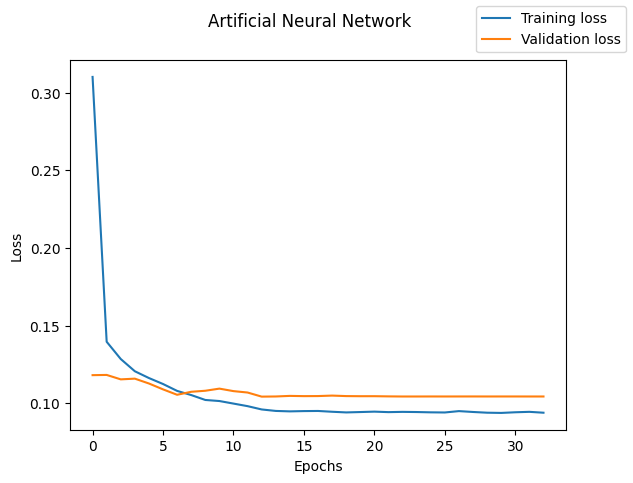

In [34]:
fig = plt.figure()
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
fig.legend()
fig.suptitle('Artificial Neural Network')
plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.show()

In [35]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 1024)           │       116,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,927,688 (7.35 MB)

 Trainable params: 642,562 (2.45 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,285,126 (4.90 MB)

## LIME

In [27]:
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train.to_numpy(), feature_names=list(X_train.keys()), verbose=True, mode='regression')

### For Winter

In [28]:
explr_max = explainer.explain_instance(X_test.loc['2024-1-10'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-1-10'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 33.29501343377287
Prediction_local [27.57734648]
Right: 24.288694983469167
Intercept 24.5698256267789
Prediction_local [13.49331222]
Right: 12.319532202257635


In [29]:
explr_min.show_in_notebook(show_table=True)

In [30]:
explr_max.show_in_notebook(show_table=True)

### For Summer

In [31]:
explr_max = explainer.explain_instance(X_test.loc['2024-05-1'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-05-1'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 30.896892987908124
Prediction_local [34.52979908]
Right: 35.04135721909109
Intercept 20.416824629457295
Prediction_local [26.7821808]
Right: 26.340528011695987


In [32]:
explr_min.show_in_notebook(show_table=True)

In [33]:
explr_max.show_in_notebook(show_table=True)

### For Monsoon

In [34]:
explr_max = explainer.explain_instance(X_test.loc['2024-08-1'], model_gbr1.predict, num_features=X_test.columns.size)
explr_min = explainer.explain_instance(X_test.loc['2024-08-1'], model_gbr2.predict, num_features=X_test.columns.size)

Intercept 31.450730536097712
Prediction_local [34.22043276]
Right: 34.05833675738255
Intercept 20.06108386898041
Prediction_local [26.99359535]
Right: 26.81826662680813


In [35]:
explr_min.show_in_notebook(show_table=True)

In [36]:
explr_max.show_in_notebook(show_table=True)

## SHAP

In [34]:
X1000 = shap.utils.sample(X_train, 1000) 
explainer_shap = shap.Explainer(model_gbr1.predict, X1000)
shap_value= explainer_shap(X_test)

PermutationExplainer explainer: 3604it [23:17,  2.57it/s]                            


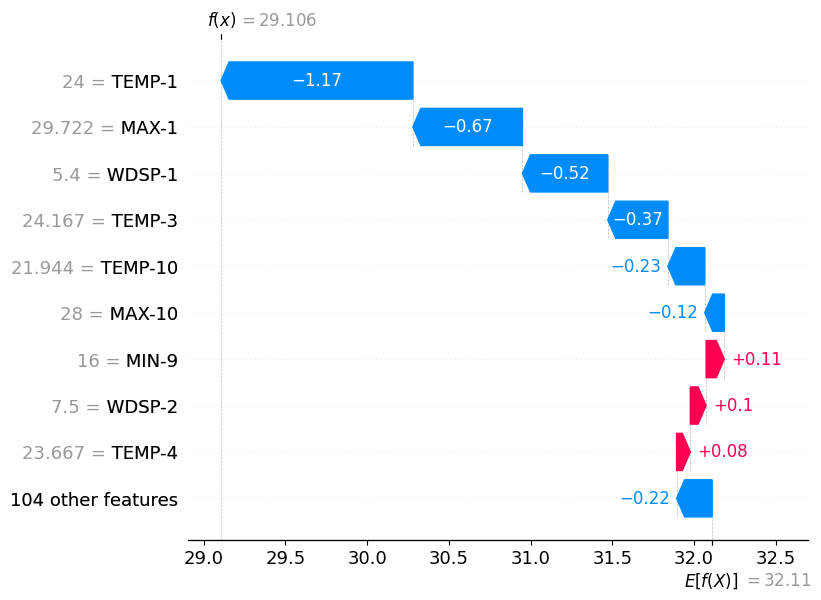

In [35]:
shap.plots.waterfall(shap_value[50])

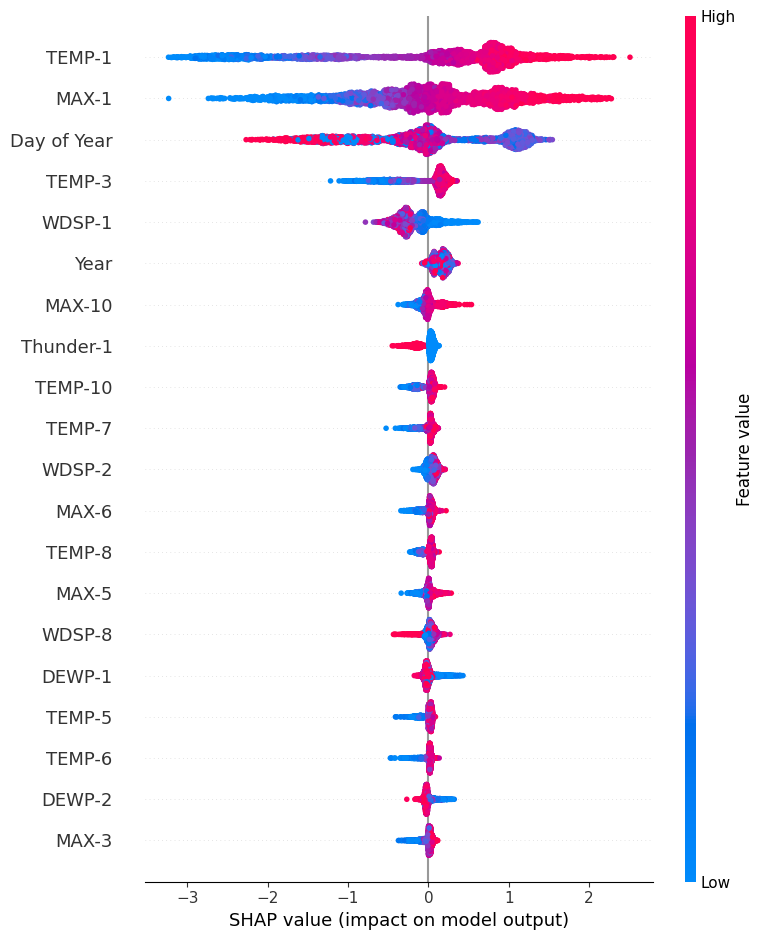

In [36]:
shap.summary_plot(shap_value, X_test)

In [37]:
explainer_shap = shap.Explainer(model_gbr2.predict, X1000)
shap_value2= explainer_shap(X_test)

PermutationExplainer explainer:   9%|▉         | 335/3603 [02:32<26:51,  2.03it/s]


KeyboardInterrupt: 

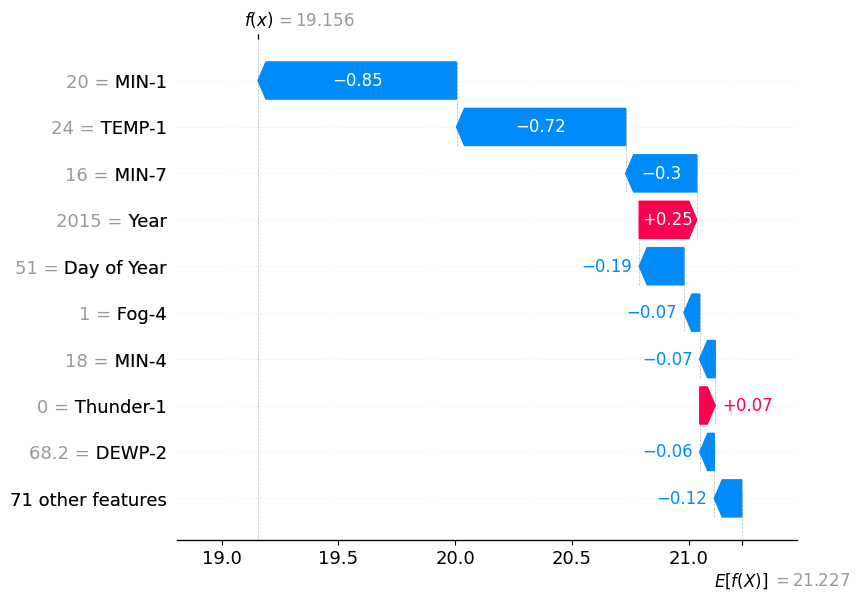

In [42]:
shap.plots.waterfall(shap_value2[50])

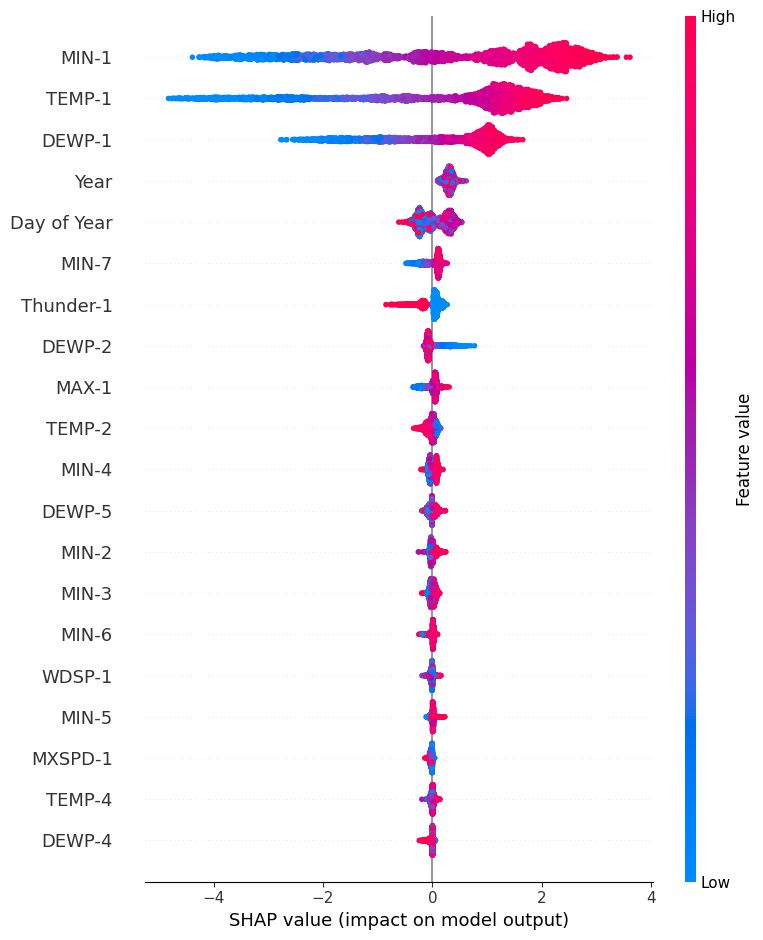

In [43]:
shap.summary_plot(shap_value2, X_test)